In [1]:
import ast

from results import test_binary_accuracy, test_images, test_labels, test_loss, averaged_predictions
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import precision_recall_curve

In [2]:
thresholds = np.arange(0, 1, 0.1)

In [3]:
thresholds

array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9])

In [4]:
# Precision: The ratio of correctly predicted positive observations to the total predicted positives
precisions = []
for threshold in thresholds:
    binary_predictions = np.where(averaged_predictions >= threshold, 1, 0)
    true_positives = np.sum((binary_predictions == 1) & (test_labels == 1))
    total_predicted_positive = np.sum(binary_predictions)
    precision = true_positives / total_predicted_positive if total_predicted_positive > 0 else 0
    precisions.append(precision)
    print(f"True Positives at threshold {threshold}: {true_positives}")
    print(f"Precision at threshold {threshold} = {precision}")

True Positives at threshold 0.0: 94
Precision at threshold 0.0 = 0.23039215686274508
True Positives at threshold 0.1: 92
Precision at threshold 0.1 = 0.5575757575757576
True Positives at threshold 0.2: 83
Precision at threshold 0.2 = 0.6194029850746269
True Positives at threshold 0.30000000000000004: 78
Precision at threshold 0.30000000000000004 = 0.7090909090909091
True Positives at threshold 0.4: 64
Precision at threshold 0.4 = 0.7272727272727273
True Positives at threshold 0.5: 52
Precision at threshold 0.5 = 0.8387096774193549
True Positives at threshold 0.6000000000000001: 46
Precision at threshold 0.6000000000000001 = 0.8846153846153846
True Positives at threshold 0.7000000000000001: 43
Precision at threshold 0.7000000000000001 = 0.9772727272727273
True Positives at threshold 0.8: 30
Precision at threshold 0.8 = 0.967741935483871
True Positives at threshold 0.9: 24
Precision at threshold 0.9 = 1.0


In [5]:
# Recall: Ratio of correctly predicted flood labels to all true flood labels in the test set
recalls = []
total_test_positives = np.sum(test_labels)
print(f"There are {total_test_positives} positive (flooding) classes in the test set")
for threshold in thresholds:
    binary_predictions = np.where(averaged_predictions >= threshold, 1, 0)
    true_positives = np.sum((binary_predictions == 1) & (test_labels == 1))
    recall = true_positives / total_test_positives if total_test_positives > 0 else 0
    recalls.append(recall)
    print(f"Recall at threshold {threshold} = {recall}")

There are 94 positive (flooding) classes in the test set
Recall at threshold 0.0 = 1.0
Recall at threshold 0.1 = 0.9787234042553191
Recall at threshold 0.2 = 0.8829787234042553
Recall at threshold 0.30000000000000004 = 0.8297872340425532
Recall at threshold 0.4 = 0.6808510638297872
Recall at threshold 0.5 = 0.5531914893617021
Recall at threshold 0.6000000000000001 = 0.48936170212765956
Recall at threshold 0.7000000000000001 = 0.4574468085106383
Recall at threshold 0.8 = 0.3191489361702128
Recall at threshold 0.9 = 0.2553191489361702


In [6]:
# F1 Scores: The threshold that gives the highest F1 score can be considered optimal
f1_scores = []
for i, threshold in enumerate(thresholds):
    f1_score = 2 * (precisions[i] * recalls[i]) / (precisions[i] + recalls[i])
    print(f"F1 Score for Threshold {threshold}: {f1_score}")
    f1_scores.append(f1_score)

F1 Score for Threshold 0.0: 0.37450199203187245
F1 Score for Threshold 0.1: 0.7104247104247104
F1 Score for Threshold 0.2: 0.7280701754385965
F1 Score for Threshold 0.30000000000000004: 0.764705882352941
F1 Score for Threshold 0.4: 0.7032967032967034
F1 Score for Threshold 0.5: 0.6666666666666666
F1 Score for Threshold 0.6000000000000001: 0.6301369863013698
F1 Score for Threshold 0.7000000000000001: 0.6231884057971016
F1 Score for Threshold 0.8: 0.4800000000000001
F1 Score for Threshold 0.9: 0.4067796610169491


In [7]:
# False positives at threshold 0.3
binary_predictions = np.where(averaged_predictions >= 0.3, 1, 0)
false_positives = np.sum((binary_predictions == 1) & (test_labels == 0))
print(f"False positives using threshold 0.3: {false_positives}")

False positives using threshold 0.3: 32


In [8]:
# False positives at threshold 0.4
binary_predictions = np.where(averaged_predictions >= 0.4, 1, 0)
false_positives = np.sum((binary_predictions == 1) & (test_labels == 0))
print(f"False positives using threshold 0.4: {false_positives}")

Accuracy at 0.3: 0.8823529411764706


In [9]:
# False positives at threshold 0.5
binary_predictions = np.where(averaged_predictions >= 0.5, 1, 0)
false_positives = np.sum((binary_predictions == 1) & (test_labels == 0))
print(f"False positives using threshold 0.5: {false_positives}")

False positives using threshold 0.4: 24


In [10]:
# Using threshold 0.5 from here on
true_positives_indices = np.where((binary_predictions == 1) & (test_labels == 1))
true_negative_indices = np.where((binary_predictions == 0) & (test_labels == 0))
false_positives_indices = np.where((binary_predictions == 1) & (test_labels == 0))
false_negative_indices = np.where((binary_predictions == 0) & (test_labels == 1))

Accuracy at 0.4: 0.8676470588235294


In [13]:
# Calculate accuracy from ensemble predictions
correct_predictions = np.sum(binary_predictions == test_labels)
total_predictions = len(test_labels)
accuracy = correct_predictions / total_predictions

print(f"Accuracy: {accuracy}")

Accuracy: 0.8725490196078431


In [14]:
true_positives_images = test_images[true_positives_indices]
false_positive_images = test_images[false_positives_indices]
true_negative_images = test_images[true_negative_indices]
false_negative_images = test_images[false_negative_indices]

In [15]:
import math
def display_images(n_images, rgb_images, captions=None, save_path=None):
    # Calculate the number of rows needed
    rows = math.ceil(n_images / 4)

    # Create a figure with a grid of subplots
    fig, axs = plt.subplots(rows, 4, figsize=(15, 5 * rows))

    # Handle the case where there's only one row, which means axs is a 1D array
    if rows == 1:
        axs = np.expand_dims(axs, axis=0)

    for i in range(n_images):
        row = i // 4
        col = i % 4
        img = rgb_images[i]
        if captions:
            axs[row, col].set_title(captions[i])
        axs[row, col].imshow(img)
        axs[row, col].axis('off')  # To hide axes

    # Turn off any remaining empty subplots
    for i in range(n_images, rows * 4):
        row = i // 4
        col = i % 4
        axs[row, col].axis('off')

    plt.tight_layout()
    if save_path:
        plt.savefig(save_path)
    plt.show()


In [16]:
def get_random_sample(n, images):
    sampled_indices = np.random.choice(images.shape[0], n, replace=False)
    return images[sampled_indices]

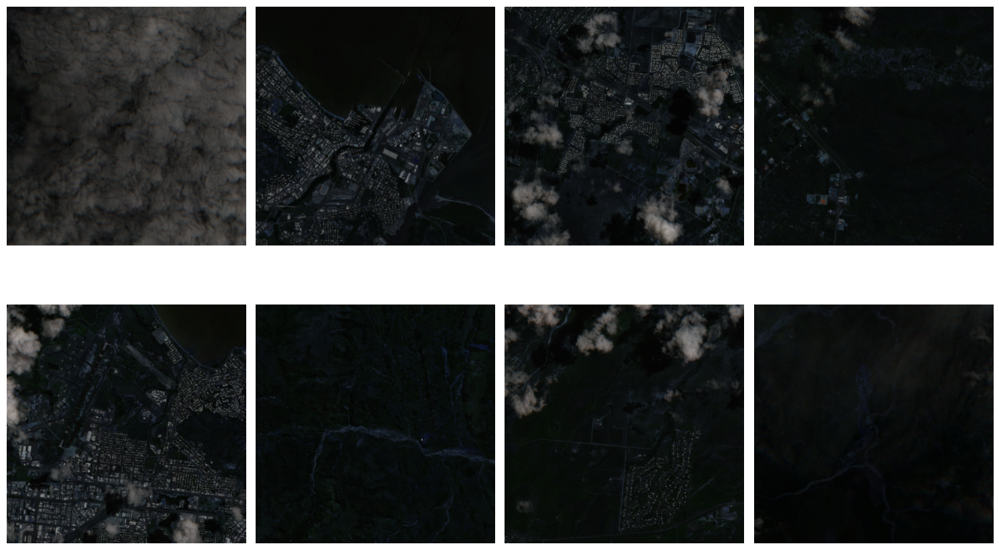

In [17]:
n = 8
display_images(n, get_random_sample(n, true_positives_images), save_path="./true_positive_samples.png")

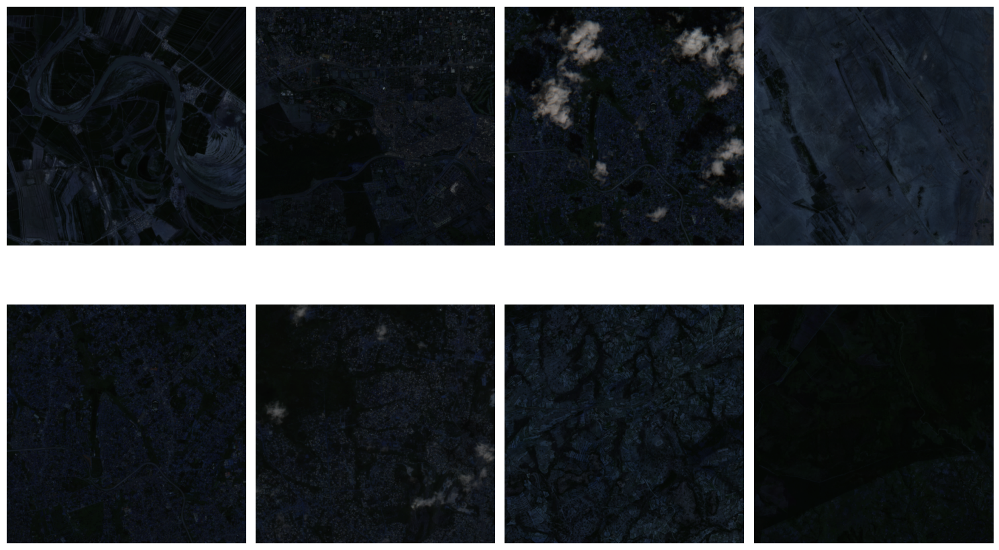

In [18]:
display_images(n, get_random_sample(n, true_negative_images), save_path="./true_negative_samples.png")

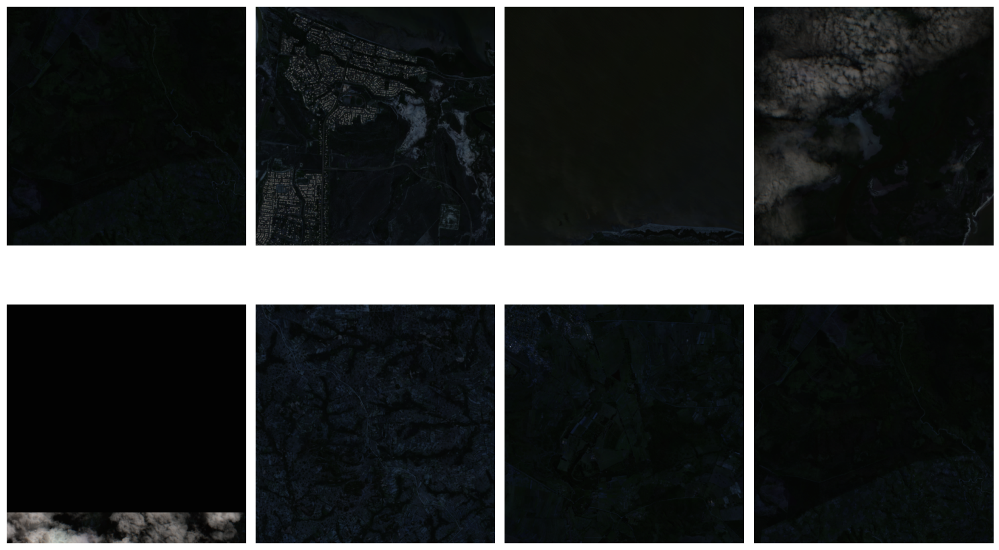

In [19]:
display_images(n, get_random_sample(n, false_negative_images), save_path="./false_negative_samples.png")

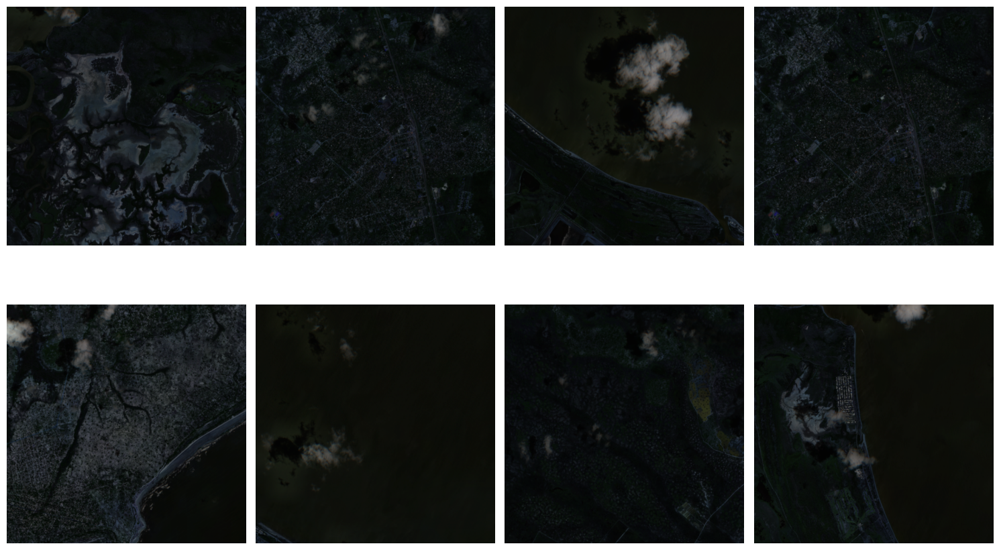

In [20]:
display_images(n, get_random_sample(n, false_positive_images), save_path="./false_positive_samples.png")

In [21]:
import pandas as pd
image_info = pd.read_csv("s2_labels_filtered.csv")

In [22]:
image_info

,directory,file_name,flooding_label,date,full_data_label,geo_type,geo_coordinates
0,0,S2_2019-01-31,0,2019-01-31,1,Polygon,"[[[34.811154, -19.680618], [34.811675, -19.726..."
1,0,S2_2019-02-10,0,2019-02-10,1,Polygon,"[[[34.811154, -19.680618], [34.811675, -19.726..."
2,0,S2_2019-02-25,0,2019-02-25,1,Polygon,"[[[34.811154, -19.680618], [34.811675, -19.726..."
3,0,S2_2019-03-12,1,2019-03-12,1,Polygon,"[[[34.811154, -19.680618], [34.811675, -19.726..."
4,0,S2_2019-04-16,1,2019-04-16,1,Polygon,"[[[34.811154, -19.680618], [34.811675, -19.726..."
...,...,...,...,...,...,...,...
2034,9,S2_2018-12-17,0,2018-12-17,0,Polygon,"[[[32.558199, -25.771287], [32.558027, -25.817..."
2035,9,S2_2018-12-27,0,2018-12-27,1,Polygon,"[[[32.558199, -25.771287], [32.558027, -25.817..."
2036,9,S2_2019-01-24,0,2019-01-24,1,Polygon,"[[[32.558199, -25.771287], [32.558027, -25.817..."
2037,9,S2_2019-01-31,0,2019-01-31,1,Polygon,"[[[32.558199, -25.771287], [32.558027, -25.817..."


In [11]:
test_indices = np.load("./data/test_indices.npy")
test_indices

In [12]:
test_image_info = image_info.iloc[test_indices]

In [15]:
test_image_info

0.23001471309465424

In [26]:
tp_info = test_image_info.iloc[true_positives_indices]
tn_info = test_image_info.iloc[true_negative_indices]
fp_info = test_image_info.iloc[false_positives_indices]
fn_info = test_image_info.iloc[false_negative_indices]

In [27]:
tp_info = tp_info.sort_values(by="directory")

In [28]:
tp_info

,directory,file_name,flooding_label,date,full_data_label,geo_type,geo_coordinates
3,0,S2_2019-03-12,1,2019-03-12,1,Polygon,"[[[34.811154, -19.680618], [34.811675, -19.726..."
1946,6,S2_2019-02-13,1,2019-02-13,1,Polygon,"[[[146.900099, -19.230725], [146.900071, -19.2..."
1660,15,S2_2019-04-14,1,2019-04-14,1,Polygon,"[[[32.701227, -20.016906], [32.701139, -20.063..."
1702,20,S2_2019-04-19,1,2019-04-19,1,Polygon,"[[[32.573931, -19.855072], [32.573807, -19.901..."
1779,32,S2_2019-03-15,1,2019-03-15,1,Polygon,"[[[146.851385, -19.230692], [146.851344, -19.2..."
1916,53,S2_2019-03-15,1,2019-03-15,1,Polygon,"[[[146.753959, -19.230587], [146.75389, -19.27..."
1915,53,S2_2019-02-28,1,2019-02-28,1,Polygon,"[[[146.753959, -19.230587], [146.75389, -19.27..."
556,138,S2_2019-03-25,1,2019-03-25,1,Polygon,"[[[34.242504, -15.487565], [34.242781, -15.533..."
601,146,S2_2019-03-12,1,2019-03-12,1,Polygon,"[[[34.761825, -19.634857], [34.76233, -19.6811..."
663,157,S2_2019-03-12,1,2019-03-12,1,Polygon,"[[[34.909347, -19.72585], [34.909898, -19.7720..."


In [29]:
fn_info = fn_info.sort_values(by="directory")
fn_info

,directory,file_name,flooding_label,date,full_data_label,geo_type,geo_coordinates
1636,1,S2_2019-03-28,1,2019-03-28,1,Polygon,"[[[31.575614, -19.220605], [31.575214, -19.266..."
1827,4,S2_2019-02-28,1,2019-02-28,1,Polygon,"[[[146.60793, -19.184062], [146.60782, -19.230..."
1708,21,S2_2019-03-25,1,2019-03-25,1,Polygon,"[[[32.622722, -19.901449], [32.622612, -19.947..."
1778,32,S2_2019-02-28,1,2019-02-28,1,Polygon,"[[[146.851385, -19.230692], [146.851344, -19.2..."
1787,34,S2_2019-03-25,1,2019-03-25,1,Polygon,"[[[32.629098, -20.197137], [32.628988, -20.243..."
1851,43,S2_2019-04-19,1,2019-04-19,1,Polygon,"[[[32.8954, -19.733733], [32.89537, -19.780002..."
1872,46,S2_2019-02-28,1,2019-02-28,1,Polygon,"[[[146.70541, -19.137972], [146.705328, -19.18..."
1958,61,S2_2019-03-25,1,2019-03-25,1,Polygon,"[[[32.671636, -19.901546], [32.671541, -19.947..."
2013,67,S2_2019-04-01,1,2019-04-01,0,Polygon,"[[[34.859977, -19.680119], [34.860512, -19.726..."
2014,67,S2_2019-04-06,1,2019-04-06,0,Polygon,"[[[34.859977, -19.680119], [34.860512, -19.726..."


In [30]:
all_images = np.load("./data/scaled_clahe_rgb_images_filtered.npy")
# True positive for image3 and image4
series_image1 = all_images[1913]
series_image2 = all_images[1914]
series_image3 = all_images[1915]
series_image4 = all_images[1916]

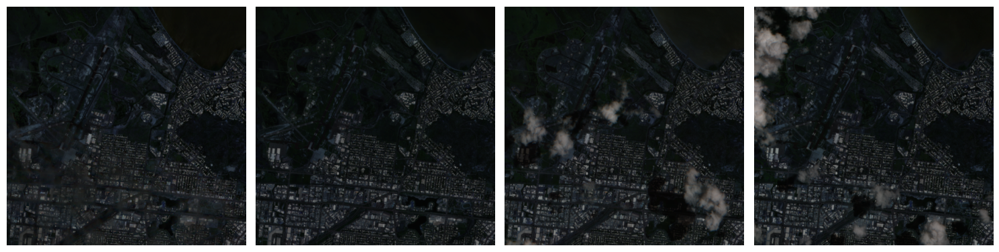

In [31]:
display_images(4, [series_image1, series_image2, series_image3, series_image4])

In [32]:
image_info.iloc[650:660]

,directory,file_name,flooding_label,date,full_data_label,geo_type,geo_coordinates
650,156,S2_2019-01-26,0,2019-01-26,0,Polygon,"[[[34.860512, -19.726364], [34.861048, -19.772..."
651,156,S2_2019-01-31,0,2019-01-31,1,Polygon,"[[[34.860512, -19.726364], [34.861048, -19.772..."
652,156,S2_2019-02-10,0,2019-02-10,1,Polygon,"[[[34.860512, -19.726364], [34.861048, -19.772..."
653,156,S2_2019-02-25,0,2019-02-25,1,Polygon,"[[[34.860512, -19.726364], [34.861048, -19.772..."
654,156,S2_2019-03-12,1,2019-03-12,1,Polygon,"[[[34.860512, -19.726364], [34.861048, -19.772..."
655,156,S2_2019-04-01,1,2019-04-01,0,Polygon,"[[[34.860512, -19.726364], [34.861048, -19.772..."
656,156,S2_2019-04-06,1,2019-04-06,0,Polygon,"[[[34.860512, -19.726364], [34.861048, -19.772..."
657,156,S2_2019-04-16,1,2019-04-16,1,Polygon,"[[[34.860512, -19.726364], [34.861048, -19.772..."
658,156,S2_2019-04-21,1,2019-04-21,0,Polygon,"[[[34.860512, -19.726364], [34.861048, -19.772..."
659,157,S2_2019-01-26,0,2019-01-26,1,Polygon,"[[[34.909347, -19.72585], [34.909898, -19.7720..."


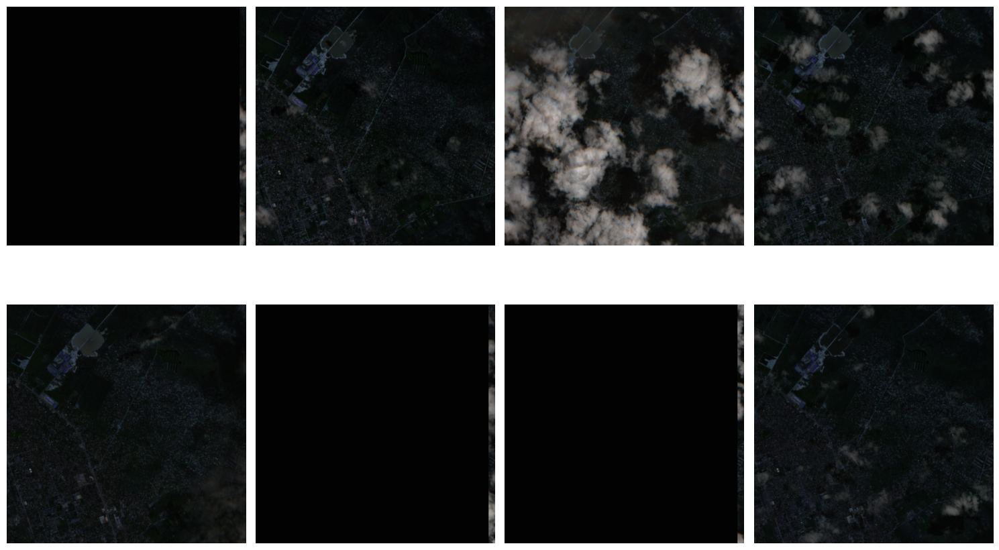

In [33]:
# False negatives for 654 and 656
series_image1 = all_images[650]
series_image2 = all_images[651]
series_image3 = all_images[652]
series_image4 = all_images[653]
series_image5 = all_images[654]
series_image6 = all_images[655]
series_image7 = all_images[656]
series_image8 = all_images[657]
display_images(8, [series_image1, series_image2, series_image3, series_image4, series_image5, series_image6, series_image7, series_image8])

In [34]:
fp_info = fp_info.sort_values(by="directory")
fp_indices = fp_info.index.tolist()
fp_info

,directory,file_name,flooding_label,date,full_data_label,geo_type,geo_coordinates
1713,22,S2_2019-02-02,0,2019-02-02,1,Polygon,"[[[38.159384, -17.231507], [38.159174, -17.277..."
1714,22,S2_2019-02-27,0,2019-02-27,1,Polygon,"[[[38.159384, -17.231507], [38.159174, -17.277..."
2009,67,S2_2019-01-31,0,2019-01-31,1,Polygon,"[[[34.859977, -19.680119], [34.860512, -19.726..."
565,140,S2_2019-01-31,0,2019-01-31,1,Polygon,"[[[34.712523, -19.589079], [34.713013, -19.635..."
567,140,S2_2019-02-25,0,2019-02-25,1,Polygon,"[[[34.712523, -19.589079], [34.713013, -19.635..."
611,148,S2_2019-02-25,0,2019-02-25,1,Polygon,"[[[34.859444, -19.633874], [34.859977, -19.680..."
1492,295,S2_2019-01-09,0,2019-01-09,1,Polygon,"[[[146.608039, -19.13779], [146.60793, -19.184..."
1496,296,S2_2019-01-09,0,2019-01-09,1,Polygon,"[[[146.656725, -19.137888], [146.656629, -19.1..."
1520,304,S2_2019-01-09,0,2019-01-09,1,Polygon,"[[[146.705328, -19.184244], [146.705246, -19.2..."
1524,305,S2_2019-01-09,0,2019-01-09,1,Polygon,"[[[146.754028, -19.184316], [146.753959, -19.2..."


In [35]:
fp_images = all_images[fp_indices]
fp_images

array([[[[ 6, 11,  7],
         [ 6, 11,  7],
         [ 8, 13,  9],
         ...,
         [48, 49, 57],
         [48, 56, 59],
         [29, 34, 33]],

        [[ 8, 11,  7],
         [ 8, 11,  7],
         [ 6, 11,  7],
         ...,
         [40, 45, 54],
         [25, 30, 33],
         [27, 34, 35]],

        [[ 6, 11,  7],
         [ 6, 11,  7],
         [ 6, 11,  7],
         ...,
         [40, 40, 44],
         [25, 28, 32],
         [29, 32, 35]],

        ...,

        [[16, 27, 23],
         [18, 21, 19],
         [26, 31, 29],
         ...,
         [ 7, 10,  5],
         [ 7,  8,  5],
         [ 7,  8,  5]],

        [[16, 25, 21],
         [ 8, 19, 13],
         [18, 25, 23],
         ...,
         [ 7,  8,  5],
         [ 7,  8,  5],
         [ 7,  8,  5]],

        [[20, 27, 25],
         [14, 21, 17],
         [14, 23, 21],
         ...,
         [ 7,  8,  5],
         [ 7,  8,  5],
         [ 7,  8,  5]]],


       [[[ 5,  8,  6],
         [ 5,  8,  6],
         [ 5, 

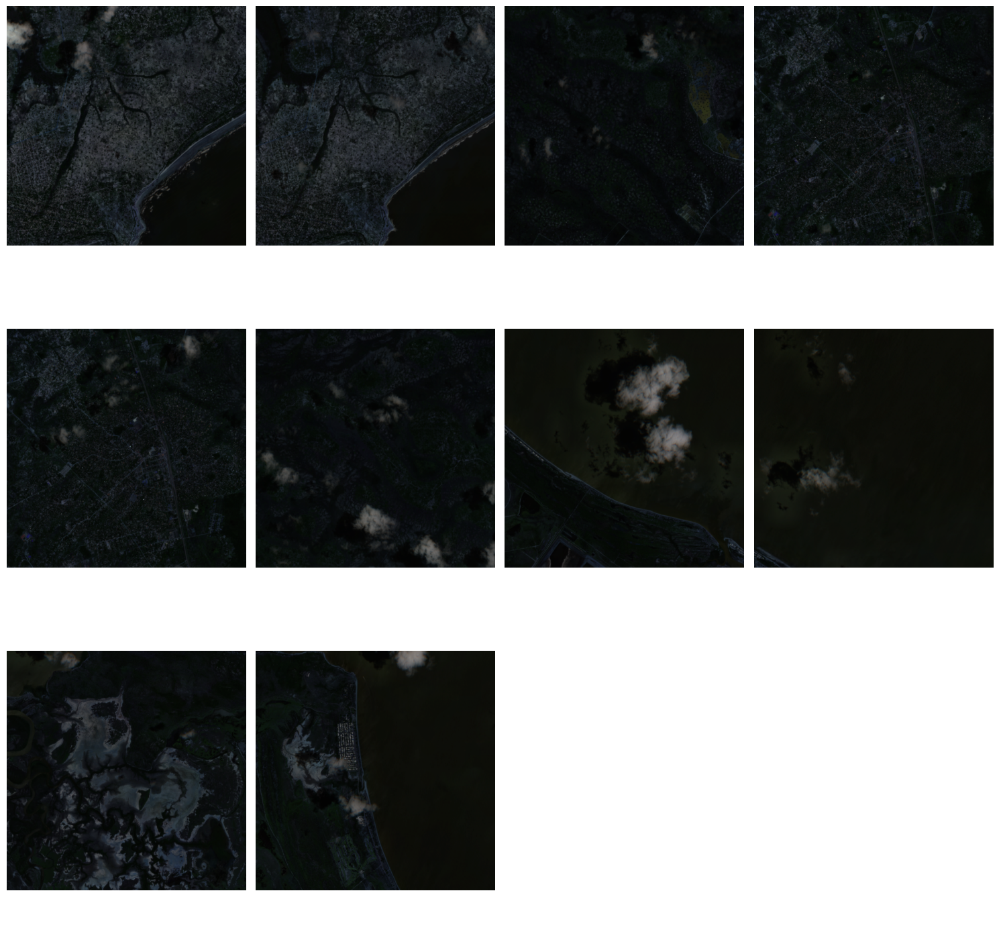

In [36]:
display_images(10, fp_images)

In [37]:
import folium

def plot_coord(coords_list, identifiers):
    

    m = folium.Map(location=coords_list[0][0][0], zoom_start=13)

    for coord, identifier in zip(coords_list, identifiers):
        folium.Marker(
            location=coord[0][0],
            popup=folium.Popup(f"{identifier}", parse_html=True)  # Popup with identifier
        ).add_to(m)
    # Display the map
    m.save('map_of_test_images.html')

In [38]:
import ast
coordinates = test_image_info['geo_coordinates'].tolist()
coordinates = [ast.literal_eval(coord_str) for coord_str in coordinates]
identifiers = test_image_info.index.tolist()
plot_coord(coordinates, identifiers)

In [39]:
# where strong true positive
binary_predictions = np.where(averaged_predictions >= 0.9, 1, 0)

In [40]:
strongly_true_positives = np.where((binary_predictions == 1) & (test_labels == 1))
strongly_true_positives

(array([  5,  14,  16,  21,  60,  93, 118, 158, 167, 191, 214, 234, 253,
        257, 277, 283, 285, 295, 299, 309, 318, 327, 368, 369]),)

In [41]:
strong_true_positive_images = test_images[strongly_true_positives]

In [42]:
#display_images(len(strong_true_positive_images), strong_true_positive_images, save_path="true_positive_09.png")


In [44]:
from sklearn.metrics import precision_recall_curve, auc
precision, recall, thresholds = precision_recall_curve(test_labels, averaged_predictions)
auc_pr = auc(recall, precision)
print(f'Area Under the Precision-Recall Curve: {auc_pr}')

Area Under the Precision-Recall Curve: 0.8433662463882485
